In [13]:
import pickle
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as K
import tensorflow as tf
from src.models.train_model import train_resnet
from src.models.detectors import Detector
from tqdm import tqdm
from copy import deepcopy
from src.data.dataset_loaders import DatasetLoader, AerialCarsDatasetLoader
from typing import Tuple
from src.features.pipelines import RawImageToImage
from src.features.processors import NormImage, Resize
from src.data.image_loaders import AerialCarsSquareImageLoader
from src.models.classifiers import ResnetModelWrapper
from src.models.detectors import NNSliderDetector
from src.data.sliders import SlidingWindow
import matplotlib.pyplot as plt

## Aerial Cars Dataset

In [14]:
# DATA_PATH = '../../data/processed/aerial-cars-dataset/data.pickle'
DATA_PATH = '../../data/processed/aerial-cars-dataset/data_fixed_norm.pickle'

In [15]:
with open(DATA_PATH, 'rb') as f:
    data = pickle.load(f)

### ResNet training

In [16]:
model, history = train_resnet(data, epochs=1)

6/6 [==============================] - 8s 1s/step - loss: 4.3720 - accuracy: 0.8492 - val_loss: 1.7932 - val_accuracy: 0.9242


### Validation

In [17]:
def validate_model(
    dataset_loader: DatasetLoader,
    input_folder_filepath: str,
    images_files_types: Tuple[str],
    annotations_files_types: Tuple[str],
    detector: Detector,
    workers: int = 0
):

    images = dataset_loader.load_dataset(
        input_folder_filepath,
        images_files_types,
        annotations_files_types,
        False
    )

    processed_images = []

    for image in tqdm(images):
        processed_images.append(
            detector(deepcopy(image), workers, False)
        )

    return processed_images

In [18]:
dataset_loader = AerialCarsDatasetLoader(
    image_loader=AerialCarsSquareImageLoader()
)

process_pipeline=RawImageToImage(
    processors=[
        # Resize((100, 100)),
        NormImage()
    ]
)

sliding_window = SlidingWindow(
    step_size=20,
    window_size=(100, 100)
)

slider_detector = NNSliderDetector(
    sliding_window=sliding_window,
    process_pipeline=process_pipeline,
    classifier=ResnetModelWrapper(model),
    treshold=0.99,
    nms_overlap=0.3
)

In [22]:
processed_images = validate_model(
    dataset_loader=dataset_loader,
    input_folder_filepath='../../data/raw/aerial-cars-dataset/val',
    images_files_types=('jpg', 'JPG', 'png'),
    annotations_files_types=('txt',),
    detector=slider_detector
)

195964
Overlap is 0.6039603960396039
Overlap is 0.48436427801195964
Overlap is 0.3647681599843153
Overlap is 0.24517204195667092
Overlap is 0.801980198019802
Overlap is 0.0059798059013822175
Overlap is 0.009900990099009901
Overlap is 0.0059798059013822175
Overlap is 0.004019213802568375
Overlap is 0.00794039800019606
Overlap is 0.12557592392902656
Overlap is 0.00794039800019606
Overlap is 0.004019213802568375
Overlap is 0.04323105577884521
Overlap is 0.08440348985393589
Overlap is 0.12557592392902656
Overlap is 0.16674835800411725
Overlap is 0.2079207920792079
Overlap is 0.16674835800411725
Overlap is 0.12557592392902656
Overlap is 0.08440348985393589
Overlap is 0.04323105577884521
Overlap is 0.002058621703754534
Overlap is 0.002058621703754534
Overlap is 0.0059798059013822175
Overlap is 0.00794039800019606
Overlap is 0.009900990099009901
Overlap is 0.00794039800019606
Overlap is 0.0059798059013822175
Overlap is 0.004019213802568375
Overlap is 0.002058621703754534
Overlap is 0.00401921

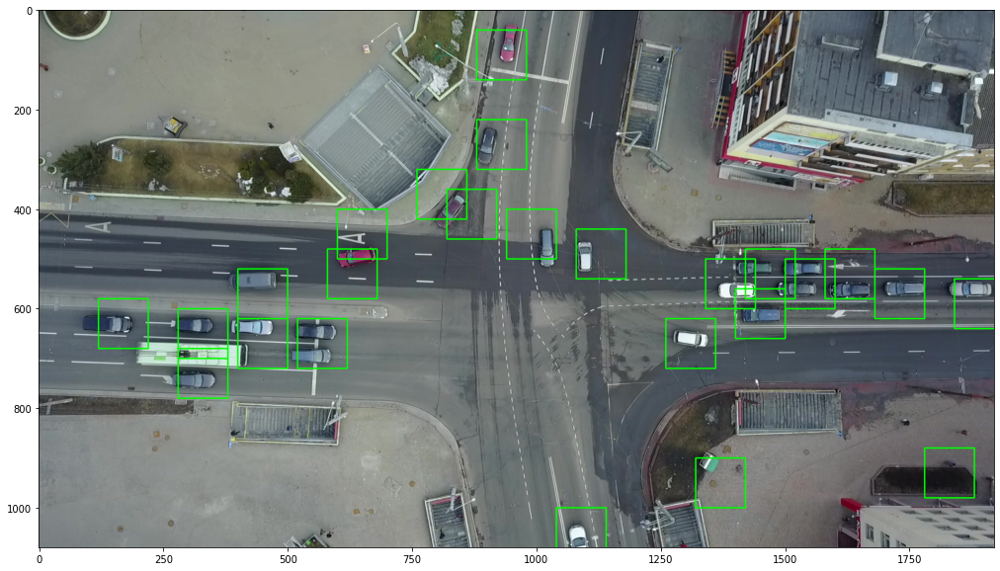

In [23]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[0][0])

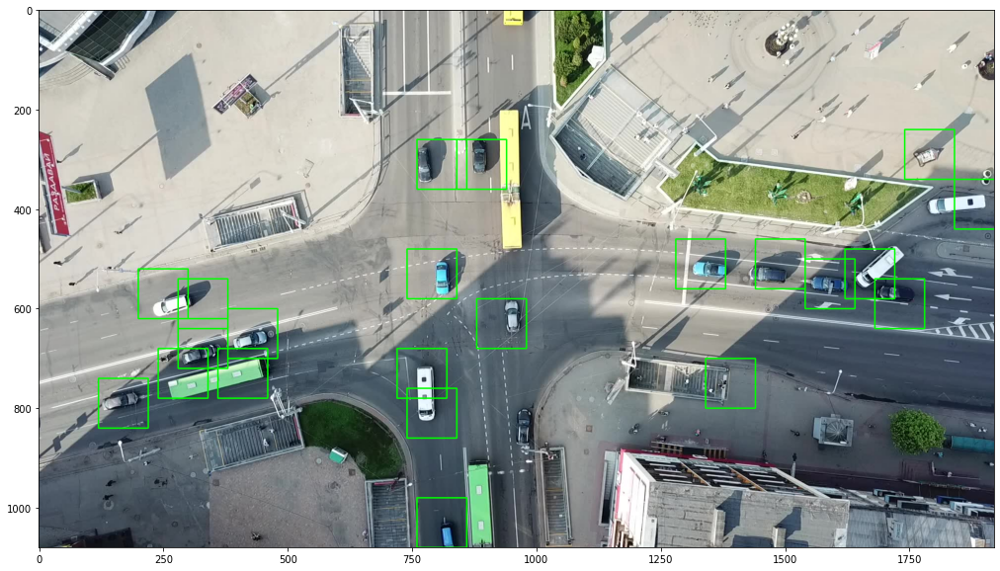

In [24]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[1][0])

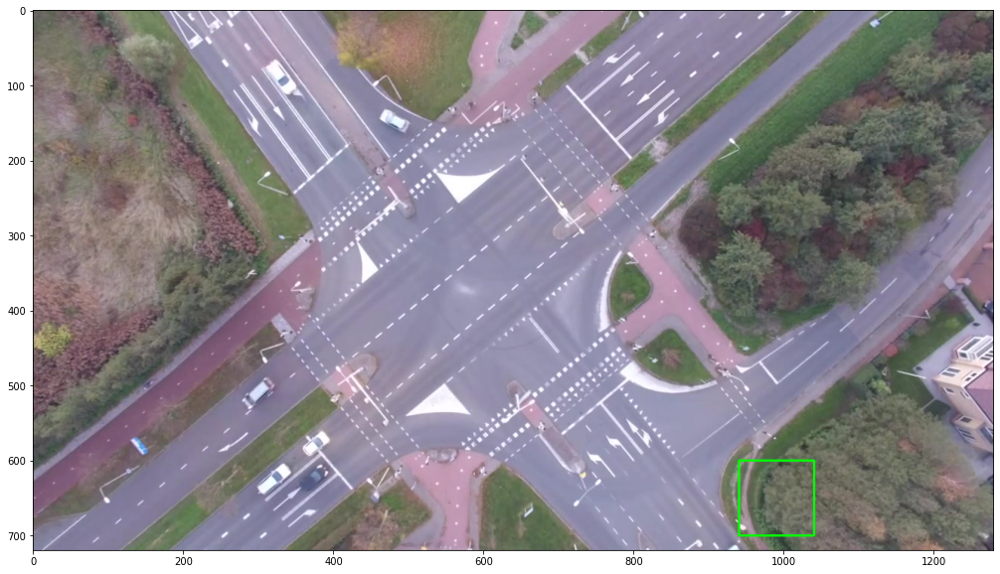

In [25]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[2][0])

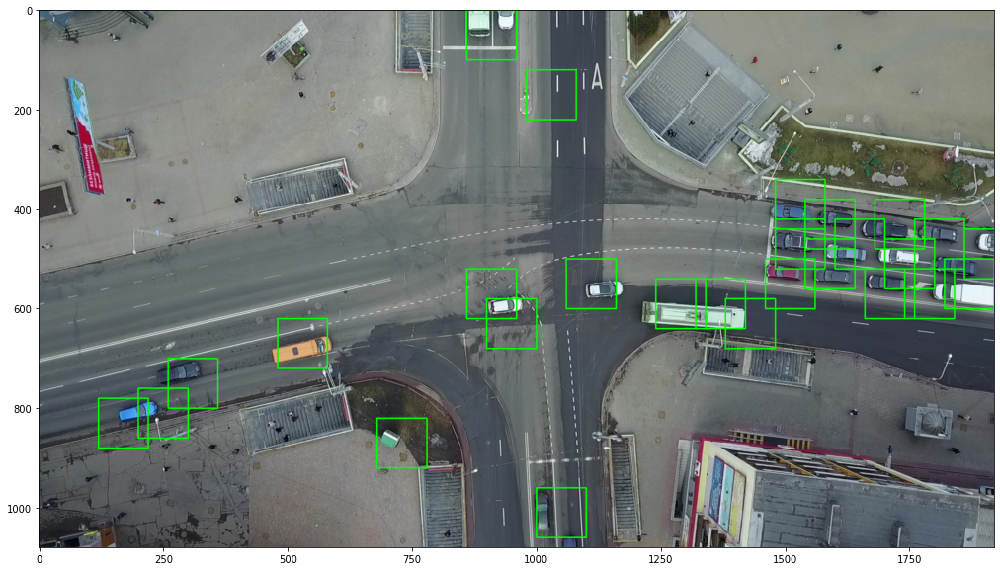

In [26]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[3][0])

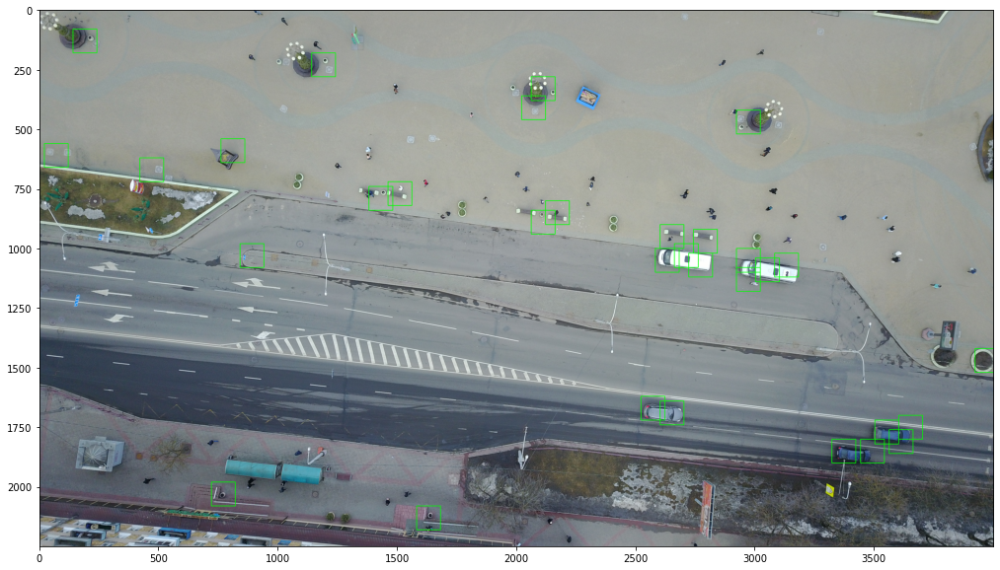

In [27]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images[4][0])

In [38]:
from src.data.dataset_loaders import DOTADatasetLoader
from src.data.image_loaders import DOTASquareImageLoader

dataset_loader = DOTADatasetLoader(
    image_loader=DOTASquareImageLoader()
)

process_pipeline=RawImageToImage(
    processors=[
        # Resize((100, 100)),
        NormImage()
    ]
)

sliding_window = SlidingWindow(
    step_size=25,
    window_size=(100, 100)
)

slider_detector = NNSliderDetector(
    sliding_window=sliding_window,
    process_pipeline=process_pipeline,
    classifier=ResnetModelWrapper(model),
    treshold=0.7,
    nms_overlap=0.4
)

In [39]:
processed_images2 = validate_model(
    dataset_loader=dataset_loader,
    input_folder_filepath='../../data/raw/dota/val_dev',
    images_files_types=('jpg', 'JPG', 'png'),
    annotations_files_types=('txt',),
    detector=slider_detector
)

  0%|          | 0/1 [00:00<?, ?it/s](216, 100, 100, 3)
(216, 100, 100, 3)
(216, 100, 100, 3)
(216, 100, 100, 3)
(216, 100, 100, 3)
(216, 100, 100, 3)
100%|██████████| 1/1 [00:16<00:00, 16.88s/it]77
Overlap is 0.06626801293990785
Overlap is 0.19370649936280757
Overlap is 0.0025487697284579942
Overlap is 0.25742574257425743
Overlap is 0.2549750024507401
Overlap is 0.004999509851975297
Overlap is 0.0025487697284579942
Overlap is 0.19370649936280757
Overlap is 0.19370649936280757
Overlap is 0.37996274875012254
Overlap is 0.504950495049505
Overlap is 0.37996274875012254
Overlap is 0.37996274875012254
Overlap is 0.7524752475247525
Overlap is 0.1299872561513577
Overlap is 0.1299872561513577
Overlap is 0.06626801293990785
Overlap is 0.2549750024507401
Overlap is 0.009900990099009901
Overlap is 0.007450249975492599
Overlap is 0.5662189981374375
Overlap is 0.1299872561513577
Overlap is 0.007450249975492599
Overlap is 0.5662189981374375
Overlap is 0.25742574257425743
Overlap is 0.504950495049505

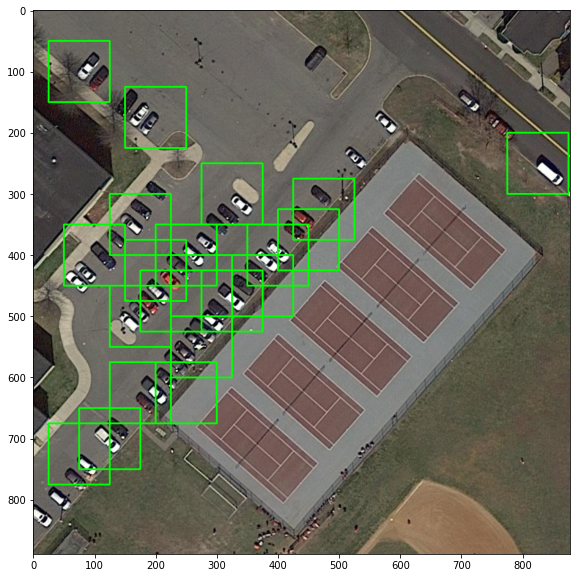

In [40]:
plt.figure(figsize=(20,10))
plt.imshow(processed_images2[0][0])